## Immune Cell Type Annotation

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.pyplot import rc_context
import scanpy as sc
import scipy.io
import os
import math
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap 
import seaborn as sns
from pathlib import Path
%matplotlib inline

In [2]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, figsize=(5, 5))
plt.set_cmap('viridis')
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

<Figure size 500x500 with 0 Axes>

In [5]:
os.chdir('')

## **immunecells 亚聚类**

In [7]:
adata=sc.read_h5ad('immune.h5ad')

In [8]:
adata.obs.loc[adata.obs_names,'CellType'] = adata.obs['CellLineage'].astype('object')

... storing 'CellType' as categorical


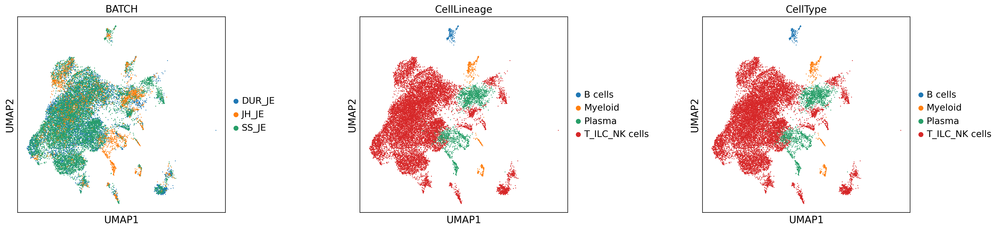

In [9]:
sc.pl.umap(adata,color=['BATCH','CellLineage','CellType'],wspace=0.5)

### T_LIC_NKceclls

In [8]:
T_ILC_NKcells=adata[adata.obs['CellLineage'].isin(['T_ILC_NK cells'])]

In [11]:
T_ILC_NKcells

View of AnnData object with n_obs × n_vars = 17158 × 15485
    obs: 'doublet_scores', 'predicted_doublets', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'BATCH', 'BREED', 'FEATURE', 'PROJECT', 'S_score', 'G2M_score', 'phase', 'cluster_0.1', 'cluster_0.2', 'cluster_0.3', 'cluster_0.4', 'cluster_0.5', 'cluster_0.6', 'cluster_0.7', 'cluster_0.8', 'cluster_0.9', 'leiden', 'louvain', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'CellLineage', 'CellType'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'BATCH_colors', 'PROJECT_colors', 'cluster_0.2_colors', 'cluster_0.3_colors', 'dendrogram_cluster_0.9', 'hvg', 'leiden', 'log1p', 'louvain', 'majority_voting_colors', 'neighbors', 'pca', 'rank_genes_0.5', 'rank_genes_cluster', 'tsne', 'umap', 'CellLineage_colors', 'CellType_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
   

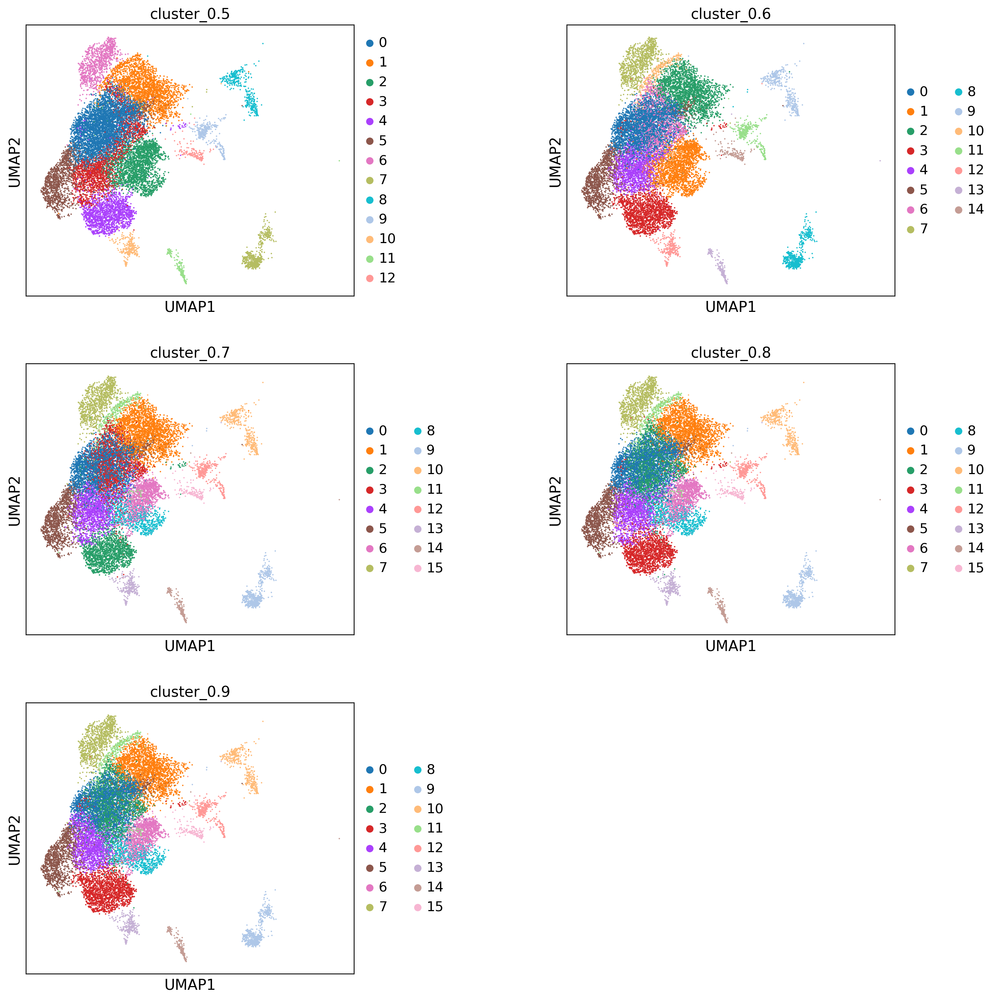

In [12]:
for i in range(5,10):
    sc.tl.leiden(T_ILC_NKcells,resolution=round(i*0.1,1),key_added=f'cluster_{round(i*0.1,1)}')
sc.pl.umap(T_ILC_NKcells,color=[f'cluster_{round(i*0.1,1)}'for i in range(5,10)],ncols=2,wspace=0.5)

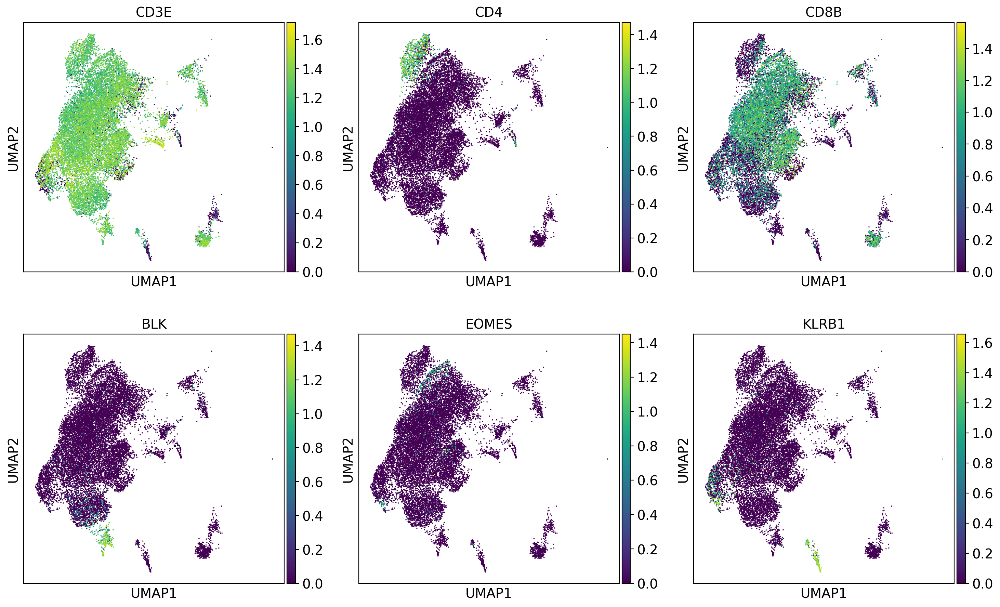

In [9]:
sc.pl.umap(T_ILC_NKcells,color=['CD3E','CD4','CD8B','BLK','EOMES','KLRB1'],ncols=3,save='_immune_marker.pdf')

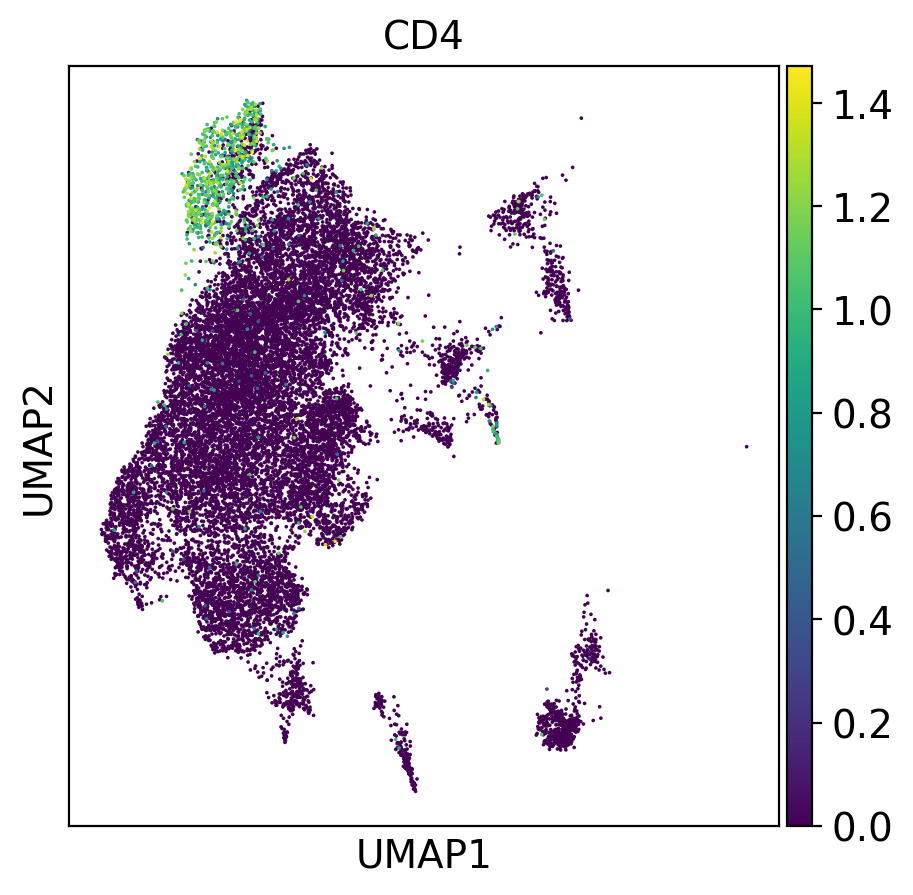

In [13]:
#CD4 αβ T cells
sc.pl.umap(T_ILC_NKcells,color=['CD4'])


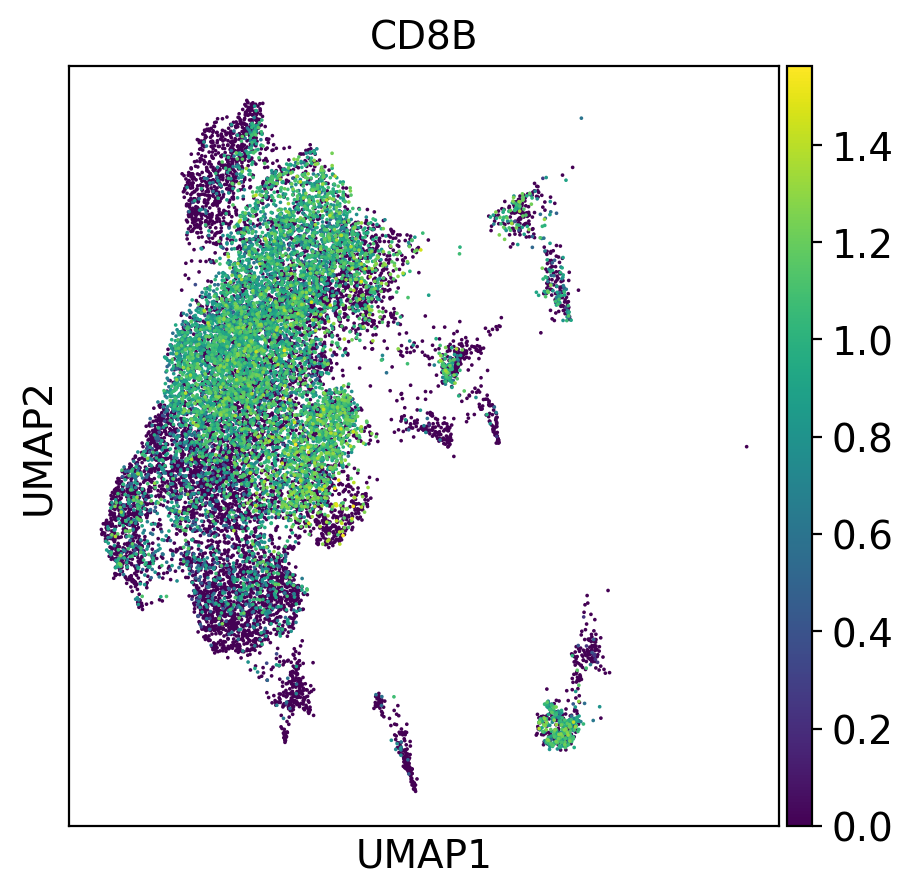

In [14]:
#CD8 αβ T cells
sc.pl.umap(T_ILC_NKcells,color=['CD8B']) 


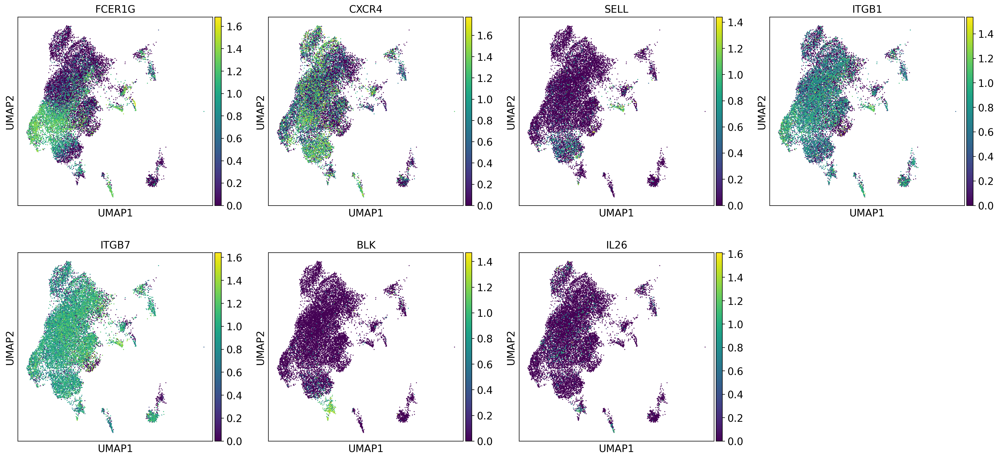

In [15]:
#γδ T cells
sc.pl.umap(T_ILC_NKcells,color=['FCER1G','CXCR4','SELL','ITGB1','ITGB7','BLK','IL26'])


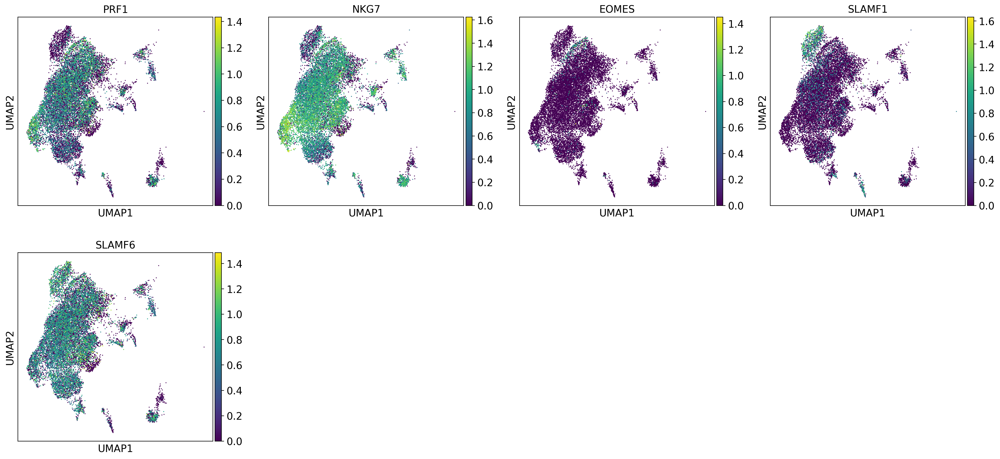

In [16]:
#NK cells
sc.pl.umap(T_ILC_NKcells,color=['PRF1','NKG7','EOMES','SLAMF1','SLAMF6'])

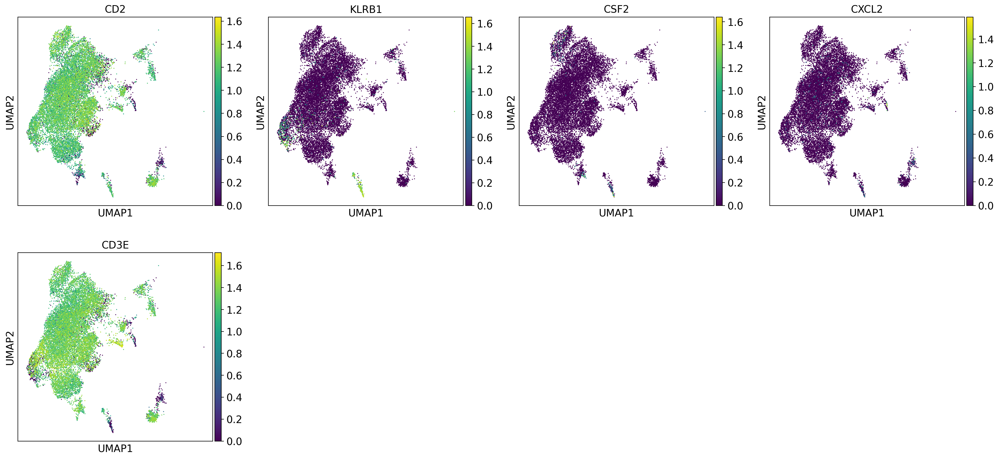

In [17]:
#ILC
sc.pl.umap(T_ILC_NKcells,color=['CD2','KLRB1','CSF2','CXCL2','CD3E'])  #high: CD2  low: CD3E

In [18]:
predictions = celltypist.annotate(T_ILC_NKcells, model = , majority_voting = True,over_clustering='cluster_0.8')
T_ILC_NKcells=predictions.to_adata()

⚠️ Warning: invalid expression matrix, expect all genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 17158 cells and 15485 genes
🔗 Matching reference genes in the model


🧬 2960 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


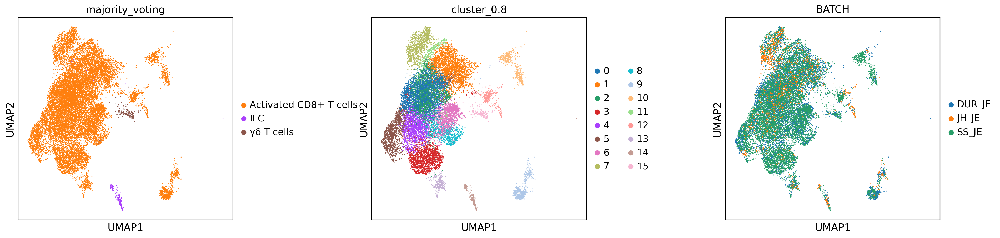

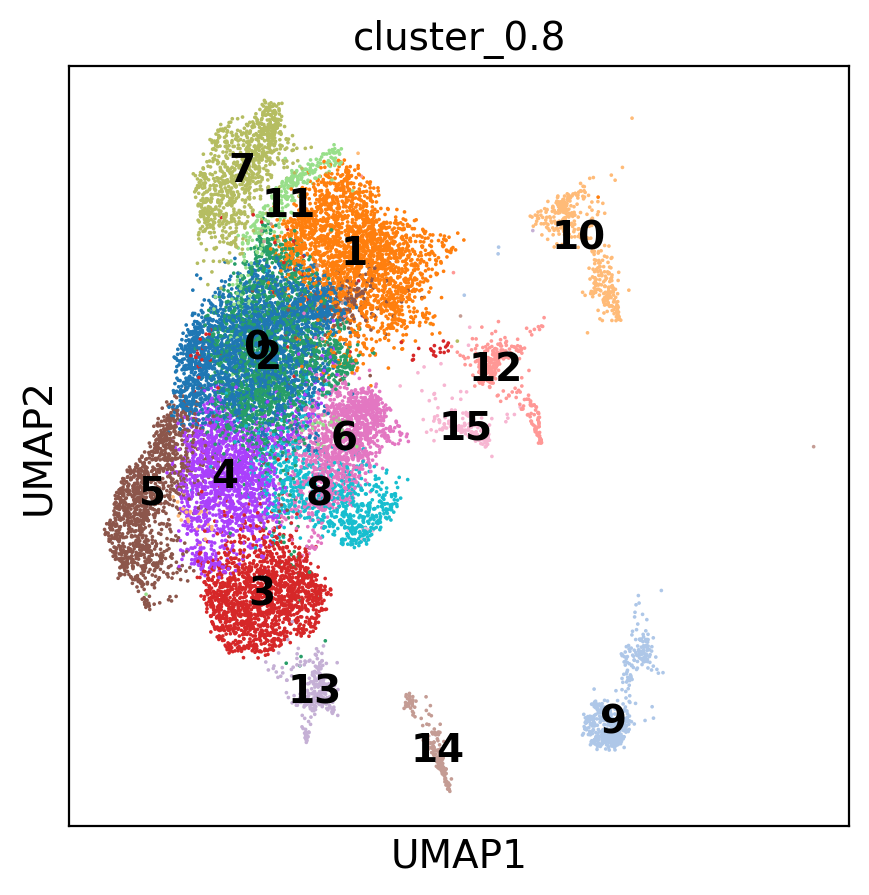

In [19]:
sc.pl.umap(T_ILC_NKcells,color=['majority_voting','cluster_0.8','BATCH'],wspace=0.5)
sc.pl.umap(T_ILC_NKcells,color=['cluster_0.8'],legend_loc='on data')

In [20]:
def function(a):
    if a in ['14']:
        return "ILC"
    elif a in ['7']:
        return "CD4 αβ T cells"
    elif a in ['0','1','2','3','4','5','6','8','9','10','12']:
        return "CD8 αβ T cells"
    elif a in ['15','13']:
        return "γδ T cells"
    elif a in ['11']:
        return "NK cells"
df = T_ILC_NKcells.obs
df["CellType"] = df.apply(lambda x: function(x['cluster_0.8']),axis=1) 

... storing 'CellType' as categorical


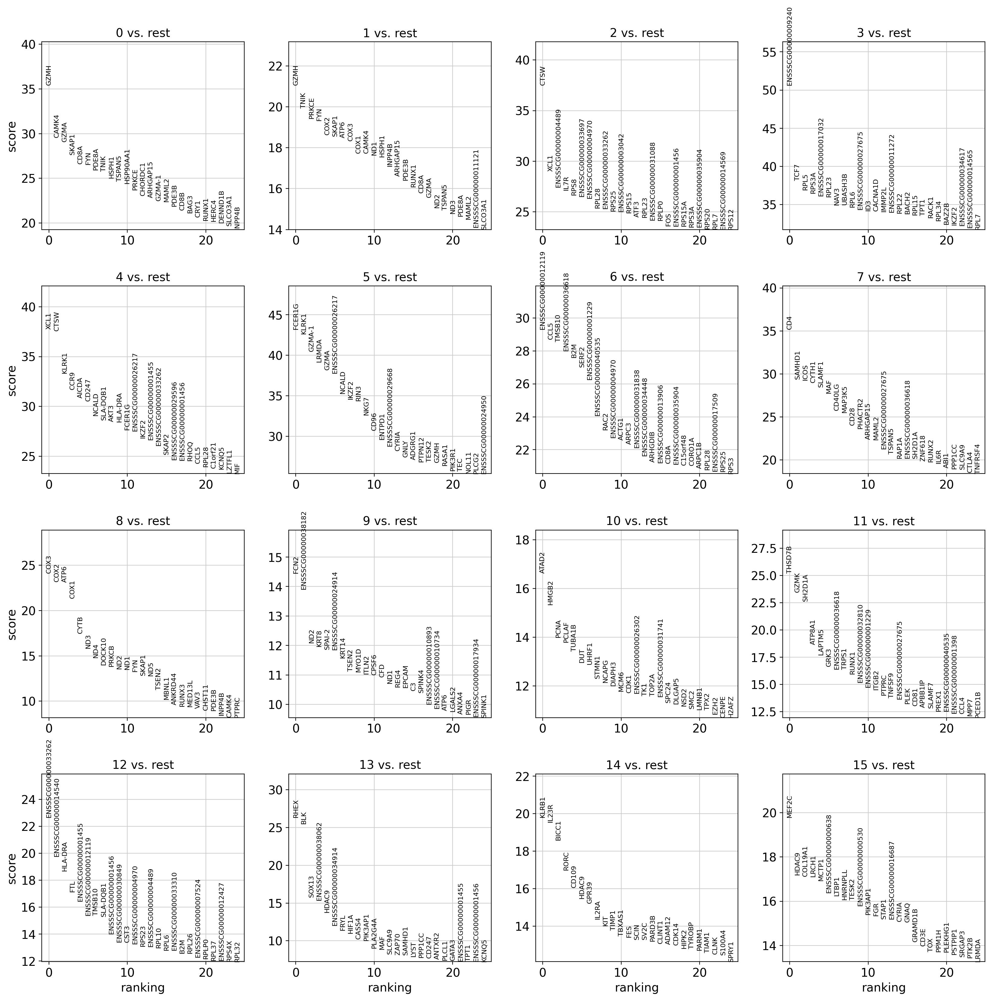

In [21]:
sc.pp.log1p(T_ILC_NKcells)
sc.tl.rank_genes_groups(T_ILC_NKcells, groupby='cluster_0.9', method='wilcoxon',key_added='rank_genes_0.9')
sc.pl.rank_genes_groups(T_ILC_NKcells, n_genes=25, sharey=False,key='rank_genes_0.9')

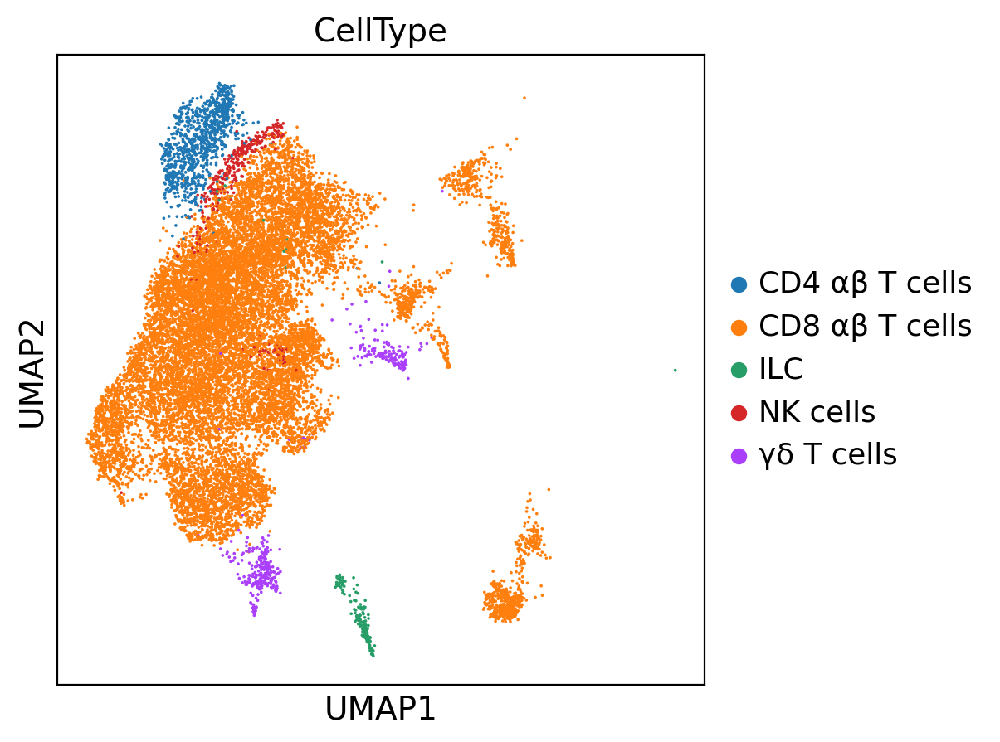

In [22]:
sc.pl.umap(T_ILC_NKcells,color=['CellType'], wspace=0.5)

In [23]:
adata.obs['CellType'] = adata.obs['CellType'].cat.add_categories("CD4 αβ T cells")
adata.obs['CellType'] = adata.obs['CellType'].cat.add_categories("CD8 αβ T cells")
adata.obs['CellType'] = adata.obs['CellType'].cat.add_categories("γδ T cells")
adata.obs['CellType'] = adata.obs['CellType'].cat.add_categories("NK cells")
adata.obs['CellType'] = adata.obs['CellType'].cat.add_categories("ILC")

In [24]:
adata.obs.loc[T_ILC_NKcells.obs_names,'CellType'] = T_ILC_NKcells.obs['CellType'].astype('object')

In [25]:
adata.obs['CellType'] = adata.obs['CellType'].cat.remove_unused_categories()

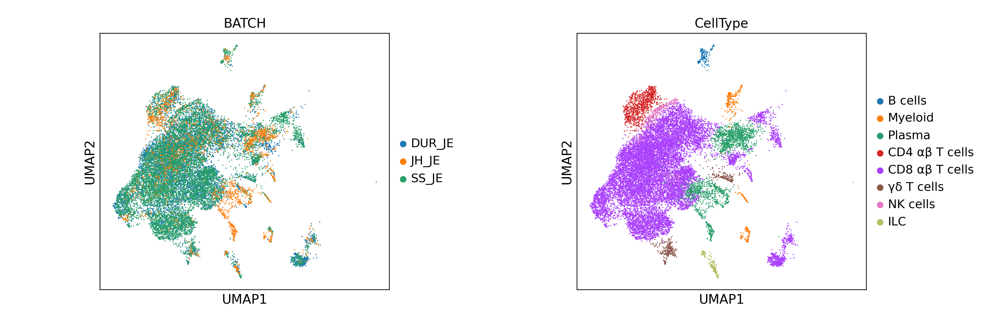

In [19]:
sc.pl.umap(adata,color=['BATCH','CellType'], wspace=0.5)

In [13]:
unique_cell_lineages = adata.obs['CellType'].unique()  
print(unique_cell_lineages)

['CD8 αβ T cells', 'γδ T cells', 'Plasma', 'NK cells', 'Myeloid', 'CD4 αβ T cells', 'ILC', 'B cells']
Categories (8, object): ['B cells', 'Myeloid', 'Plasma', 'CD4 αβ T cells', 'CD8 αβ T cells', 'γδ T cells', 'NK cells', 'ILC']


/disk211/public/anaconda3/envs/new_labBase/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


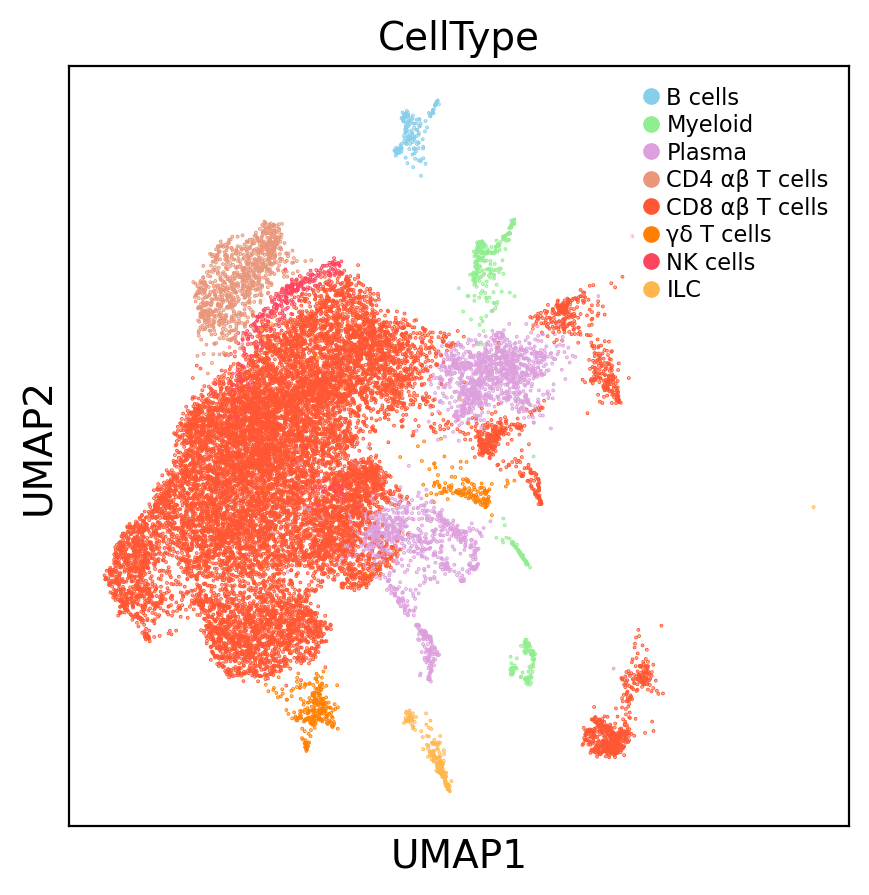

In [31]:
color_map = {      
    'B cells': '#87CEEB',   
    'Myeloid': '#90EE90',     
    'Plasma': '#DDA0DD',        
    'CD4 αβ T cells': '#E9967A', 
    'CD8 αβ T cells': '#FF5733',
    'γδ T cells': '#FF7F00',  
    'NK cells': '#FF455E', 
    'ILC': '#FFB74D',         
}  



colors = [color_map[cell_type] for cell_type in adata.obs['CellType']]  
  
sc.pl.umap(adata, color=['CellType'], ncols=2, wspace=0.5, size=0.5, show=False)  
  
ax = plt.gca()  
scatter = ax.collections[0] 
scatter.set_color(colors) 

handles = [Line2D([], [], color=color, marker='o', linestyle='none', markersize=5) for cell_type, color in color_map.items()]  
labels = list(color_map.keys())  

legend = ax.legend(handles, labels, loc='upper right', fontsize='xx-small', frameon=True,  
                   handlelength=1, handletextpad=0.2, columnspacing=0.5, labelspacing=0.2)  
  

plt.gca().legend_.get_frame().set_alpha(0.5)  
plt.gca().legend_.get_frame().set_edgecolor('white') 

plt.savefig('CellType.pdf', format='pdf', bbox_inches='tight')   
plt.show()

/disk211/public/anaconda3/envs/new_labBase/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


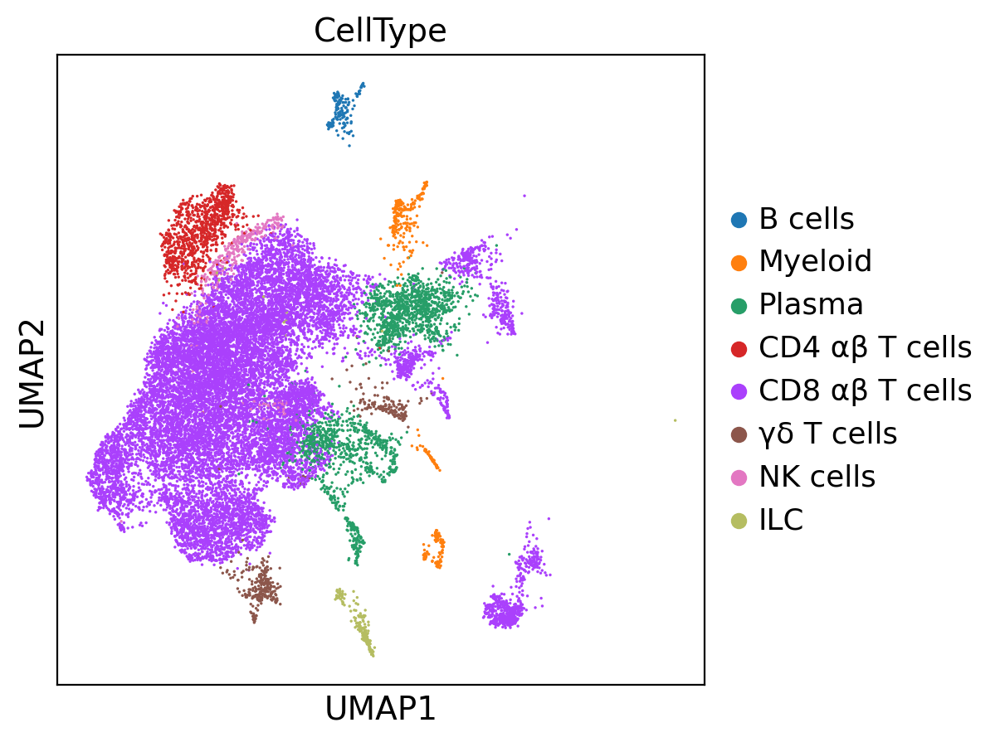

In [12]:
sc.pl.umap(adata,color=['CellType'], wspace=0.5)

In [27]:
adata.write_h5ad('CellType.h5ad')